# Here we are predict the water quality level in Water

## Domain Analysis

In [1]:
import numpy as np # use for numerical value 
import pandas as pd # use for data cleaning, data analysis
import matplotlib.pyplot as plt # data visulization
import seaborn as sns # use for data visualization
from ydata_profiling import ProfileReport # use for data auto visulaization
from sklearn.compose import ColumnTransformer # use for column transform
from sklearn.preprocessing import FunctionTransformer # use for create function
import pickle # use for save the model
import warnings # use for warning
warnings.filterwarnings("ignore") 

In [2]:
# Load the dataset
data = pd.read_csv("waterQuality1.csv")
data

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,...,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
0,1.65,9.08,0.04,2.85,0.007,0.35,0.83,0.17,0.05,0.20,...,0.054,16.08,1.13,0.007,37.75,6.78,0.08,0.34,0.02,1
1,2.32,21.16,0.01,3.31,0.002,5.28,0.68,0.66,0.90,0.65,...,0.100,2.01,1.93,0.003,32.26,3.21,0.08,0.27,0.05,1
2,1.01,14.02,0.04,0.58,0.008,4.24,0.53,0.02,0.99,0.05,...,0.078,14.16,1.11,0.006,50.28,7.07,0.07,0.44,0.01,0
3,1.36,11.33,0.04,2.96,0.001,7.23,0.03,1.66,1.08,0.71,...,0.016,1.41,1.29,0.004,9.12,1.72,0.02,0.45,0.05,1
4,0.92,24.33,0.03,0.20,0.006,2.67,0.69,0.57,0.61,0.13,...,0.117,6.74,1.11,0.003,16.90,2.41,0.02,0.06,0.02,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7994,0.05,7.78,0.00,1.95,0.040,0.10,0.03,0.03,1.37,0.00,...,0.197,14.29,1.00,0.005,3.57,2.13,0.09,0.06,0.03,1
7995,0.05,24.22,0.02,0.59,0.010,0.45,0.02,0.02,1.48,0.00,...,0.031,10.27,1.00,0.001,1.48,1.11,0.09,0.10,0.08,1
7996,0.09,6.85,0.00,0.61,0.030,0.05,0.05,0.02,0.91,0.00,...,0.182,15.92,1.00,0.000,1.35,4.84,0.00,0.04,0.05,1
7997,0.01,10,0.01,2.00,0.000,2.00,0.00,0.09,0.00,0.00,...,0.000,0.00,0.00,0.000,0.00,0.00,0.00,0.00,0.00,1


### Business Case:-
* Here we are predict the water quality level in water and decied the based on different column in this dataset like
aluminium, ammonia, arsenic	, barium, cadmium, chloramine, chromium,copper,	flouride, bacteria, viruses	,lead, nitrates, nitrites, mercury,	perchlorate, radium, selenium ,silver ,uranium ,is_safe.

### Attribute Information:-
**aluminium:-**
It is a harmfull to health.
**ammonia:-**
It is a indicate the amount of ammonia.
**arsenic:-**
It is a Measure of arsenic and serious health problem.
**barium:-**
It is a high effect in heart or kedneys.
**cadmium:-**
It is a damage on born and kedneys.
**chloramine:-**
It is a indicate the presence of chlroamine.
**chromium:-**
It is a show Measures chromium.
**copper:-**
It is a show Measures copper level.
**flouride:-**
It is a show Measures flouride Level.
**bacteria:-**
It is a indicates the presence of bacteria in the water.
**viruses:-**
It is a show the presence of viruses in water.
**lead:-**
High levels of lead exposure can cause developmental and neurological issues.
**nitrates:-**
It is a show the Measures the amount of nitrates.
**nitrites:-**
It is a show Similar to nitrates.
**mercury:-**
It is show Measures mercury levels.
**perchlorate:-**
It is a indicate the presence of perchlorate.
**radium:-**
It is a show Measures the presence of radium.
**selenium:-**
It is a show Measures the presence of selenium.
**silver:-**
It is show Measures of silver in water.
**uranium:-**
It is a show Measurs the presence of uranium.
**is_safe:-**
It is a show the water is safe or not.

## Basic Check

In [3]:
data.head() # showing the top 5 data

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,...,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
0,1.65,9.08,0.04,2.85,0.007,0.35,0.83,0.17,0.05,0.20,...,0.054,16.08,1.13,0.007,37.75,6.78,0.08,0.34,0.02,1
1,2.32,21.16,0.01,3.31,0.002,5.28,0.68,0.66,0.90,0.65,...,0.100,2.01,1.93,0.003,32.26,3.21,0.08,0.27,0.05,1
2,1.01,14.02,0.04,0.58,0.008,4.24,0.53,0.02,0.99,0.05,...,0.078,14.16,1.11,0.006,50.28,7.07,0.07,0.44,0.01,0
3,1.36,11.33,0.04,2.96,0.001,7.23,0.03,1.66,1.08,0.71,...,0.016,1.41,1.29,0.004,9.12,1.72,0.02,0.45,0.05,1
4,0.92,24.33,0.03,0.20,0.006,2.67,0.69,0.57,0.61,0.13,...,0.117,6.74,1.11,0.003,16.90,2.41,0.02,0.06,0.02,1


In [4]:
data.tail() # showning the last 5 data

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,...,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
7994,0.05,7.78,0.00,1.95,0.04,0.10,0.03,0.03,1.37,0.0,...,0.197,14.29,1.0,0.005,3.57,2.13,0.09,0.06,0.03,1
7995,0.05,24.22,0.02,0.59,0.01,0.45,0.02,0.02,1.48,0.0,...,0.031,10.27,1.0,0.001,1.48,1.11,0.09,0.10,0.08,1
7996,0.09,6.85,0.00,0.61,0.03,0.05,0.05,0.02,0.91,0.0,...,0.182,15.92,1.0,0.000,1.35,4.84,0.00,0.04,0.05,1
7997,0.01,10,0.01,2.00,0.00,2.00,0.00,0.09,0.00,0.0,...,0.000,0.00,0.0,0.000,0.00,0.00,0.00,0.00,0.00,1
7998,0.04,6.85,0.01,0.70,0.03,0.05,0.01,0.03,1.00,0.0,...,0.182,15.92,1.0,0.000,1.35,4.84,0.00,0.04,0.05,1


In [5]:
data.describe() # use for continous column show numerical function

,aluminium,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,viruses,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium
count,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000,7999.000000
mean,0.666158,0.161445,1.567715,0.042806,2.176831,0.247226,0.805857,0.771565,0.319665,0.328583,0.099450,9.818822,1.329961,0.005194,16.460299,2.920548,0.049685,0.147781,0.044673
std,1.265145,0.252590,1.216091,0.036049,2.567027,0.270640,0.653539,0.435373,0.329485,0.378096,0.058172,5.541331,0.573219,0.002967,17.687474,2.323009,0.028770,0.143551,0.026904
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.040000,0.030000,0.560000,0.008000,0.100000,0.050000,0.090000,0.405000,0.000000,0.002000,0.048000,5.000000,1.000000,0.003000,2.170000,0.820000,0.020000,0.040000,0.020000
50%,0.070000,0.050000,1.190000,0.040000,0.530000,0.090000,0.750000,0.770000,0.220000,0.008000,0.102000,9.930000,1.420000,0.005000,7.740000,2.410000,0.050000,0.080000,0.050000
75%,0.280000,0.100000,2.480000,0.070000,4.240000,0.440000,1.390000,1.160000,0.610000,0.700000,0.151000,14.610000,1.760000,0.008000,29.480000,4.670000,0.070000,0.240000,0.070000
max,5.050000,1.050000,4.940000,0.130000,8.680000,0.900000,2.000000,1.500000,1.000000,1.000000,0.200000,19.830000,2.930000,0.010000,60.010000,7.990000,0.100000,0.500000,0.090000


**Insights:-**
* Here we can see the minimum value is 0 in all columns.
* Here we can not see the any null value in any column.
* Here we can see the highest Variacne column is perchlorate.
* Here we can see the Highest standerd devation column is perchlorate.

In [6]:
data.info() # use for show the dataset information 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7999 entries, 0 to 7998
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   aluminium    7999 non-null   float64
 1   ammonia      7999 non-null   object 
 2   arsenic      7999 non-null   float64
 3   barium       7999 non-null   float64
 4   cadmium      7999 non-null   float64
 5   chloramine   7999 non-null   float64
 6   chromium     7999 non-null   float64
 7   copper       7999 non-null   float64
 8   flouride     7999 non-null   float64
 9   bacteria     7999 non-null   float64
 10  viruses      7999 non-null   float64
 11  lead         7999 non-null   float64
 12  nitrates     7999 non-null   float64
 13  nitrites     7999 non-null   float64
 14  mercury      7999 non-null   float64
 15  perchlorate  7999 non-null   float64
 16  radium       7999 non-null   float64
 17  selenium     7999 non-null   float64
 18  silver       7999 non-null   float64
 19  uraniu

**Insights:-**
* here we can see the total 7999 rows in this dataset.
* Here we can see the total 21 columns.
* Here we can see the two column datatype is wrong like is ammonia or is_safe.
* Here we can see the total floatdatatyoe column is 19 and object type column is 2.

## EDA:- Exploratory Data Analysis

In [7]:
# store dataset column in one variable
for column in data:
    print(column)

aluminium
ammonia
arsenic
barium
cadmium
chloramine
chromium
copper
flouride
bacteria
viruses
lead
nitrates
nitrites
mercury
perchlorate
radium
selenium
silver
uranium
is_safe


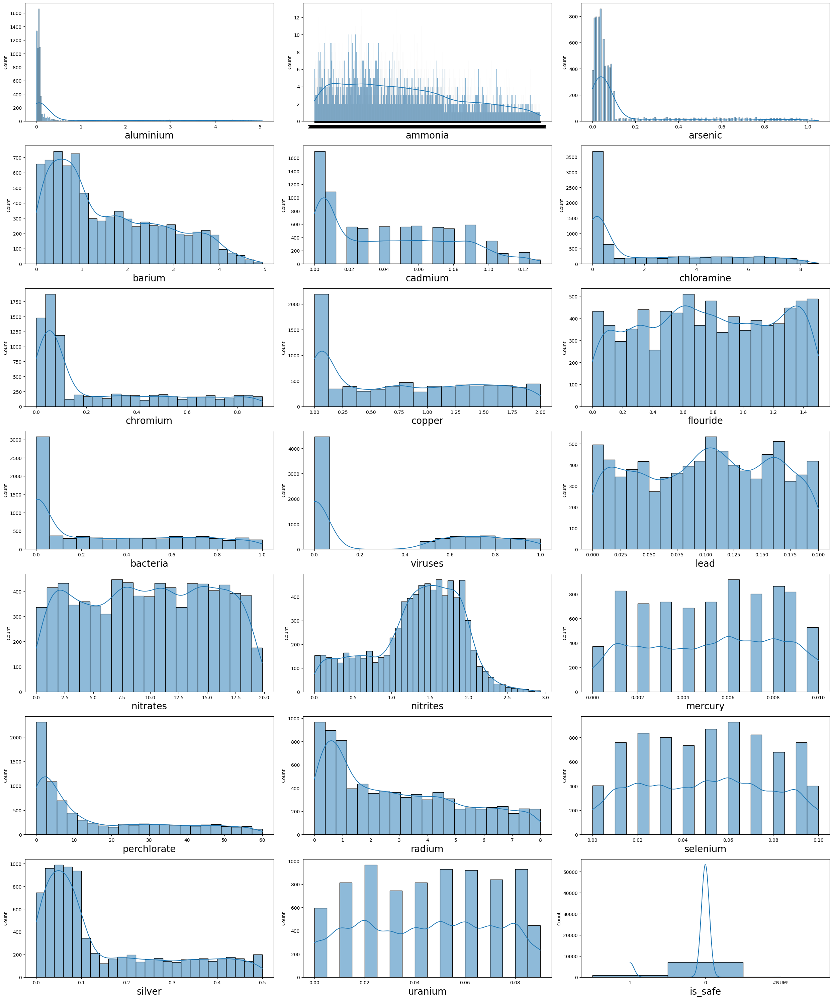

In [8]:
# Univeriant Analysis
plt.figure(figsize=(25,30)) # define the plot size
plt_num = 1
for column in data:
    if plt_num <= 21:
        plt.subplot(7,3,plt_num)
        sns.histplot(data[column],kde=True) # use for data is normal or not
        plt.xlabel(column,fontsize = 20)
    plt_num += 1
plt.tight_layout()

* Here we can not see the any normal distribution in column.

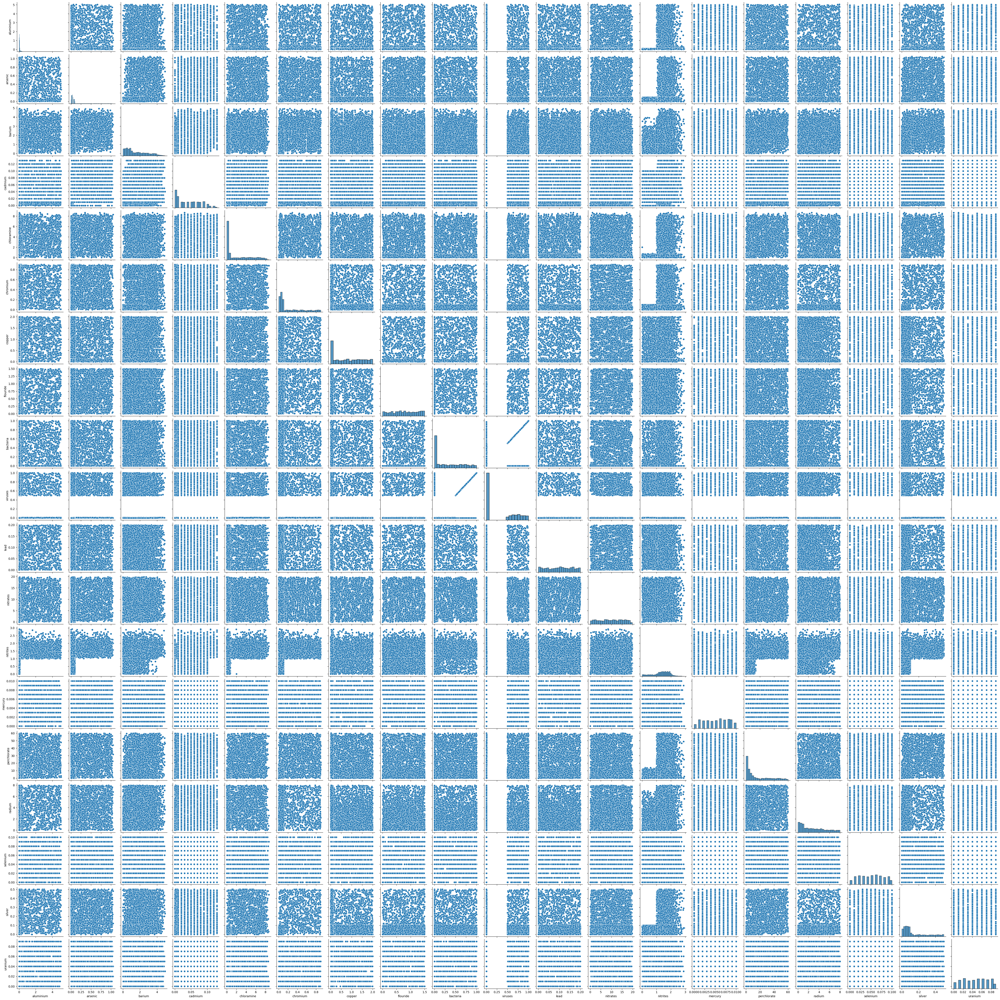

In [9]:
## Multiveriant Analysis
sns.pairplot(data)

* Here can not see the any insights

## Data Preprocessing

In [10]:
data.isnull().sum() # check the null value or not

aluminium      0
ammonia        0
arsenic        0
barium         0
cadmium        0
chloramine     0
chromium       0
copper         0
flouride       0
bacteria       0
viruses        0
lead           0
nitrates       0
nitrites       0
mercury        0
perchlorate    0
radium         0
selenium       0
silver         0
uranium        0
is_safe        0
dtype: int64

* Here not any null values.

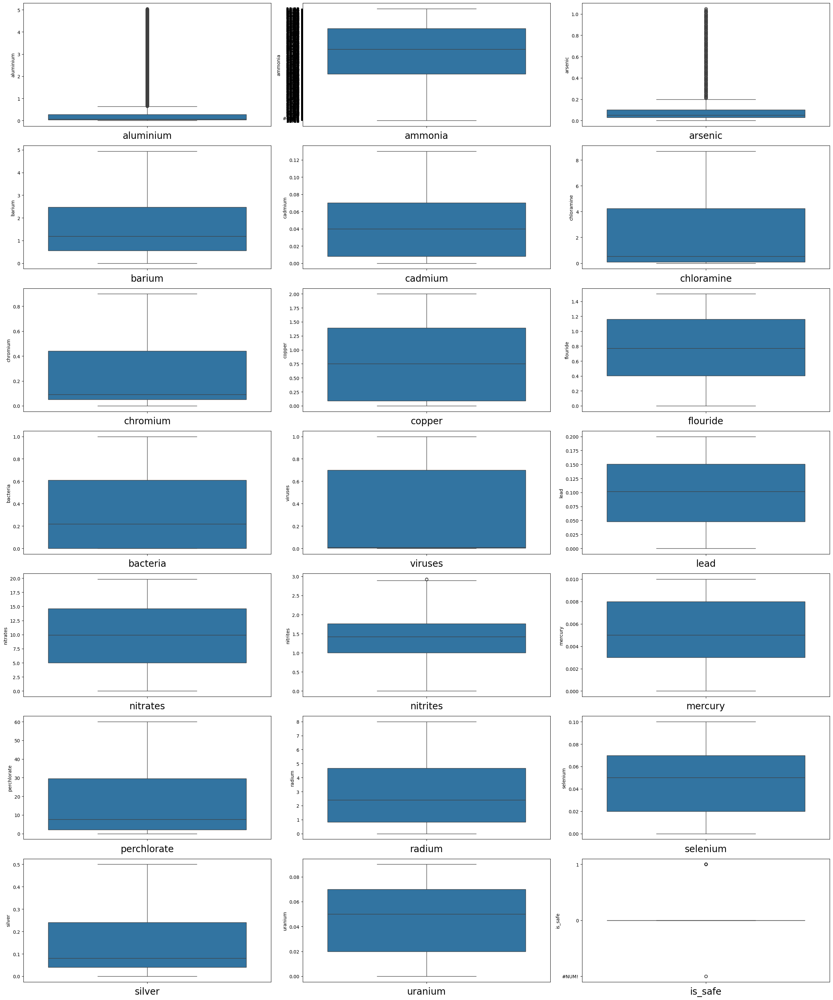

In [11]:
# Univeriant Analysis
plt.figure(figsize=(25,30)) # define the plot size
plt_num = 1
for column in data:
    if plt_num <= 21:
        plt.subplot(7,3,plt_num)
        sns.boxplot(data[column]) # use for check the outliers or not in our dataset 
        plt.xlabel(column,fontsize = 20)
    plt_num += 1
plt.tight_layout()

<Axes: xlabel='aluminium'>

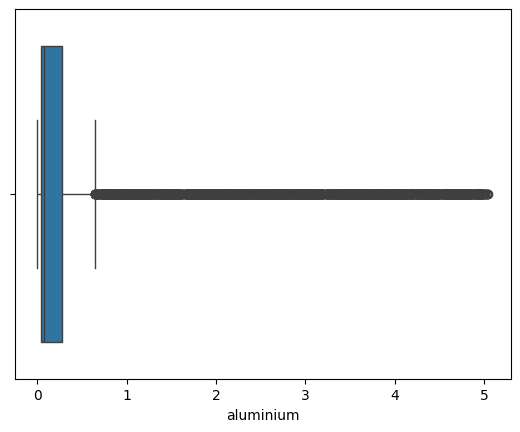

In [12]:
sns.boxplot(x = data.aluminium) # use for check outliers or not in column

<Axes: xlabel='arsenic'>

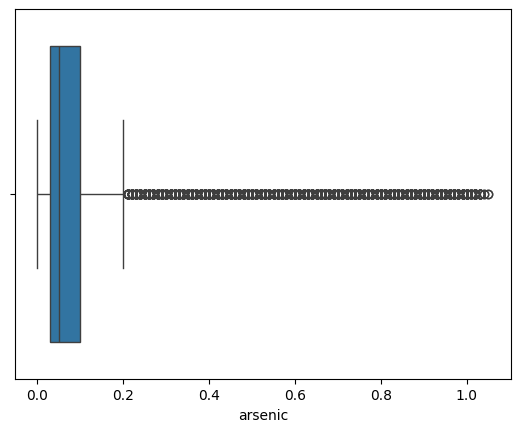

In [13]:
sns.boxplot(x = data.arsenic) # use for check outliers or not in column

<Axes: xlabel='nitrites'>

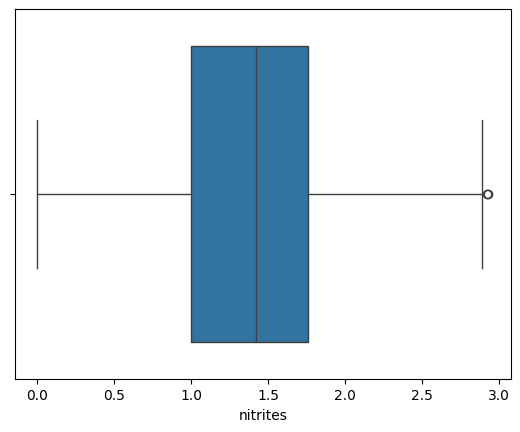

In [14]:
sns.boxplot(x = data.nitrites) # use for check outliers or not in column

In [15]:
data.nitrites.median() # find the median

1.42

In [16]:
data.loc[data["nitrites"] >=2.9,"nitrites"] = 1.42 # handle the outliers value

<Axes: xlabel='nitrites'>

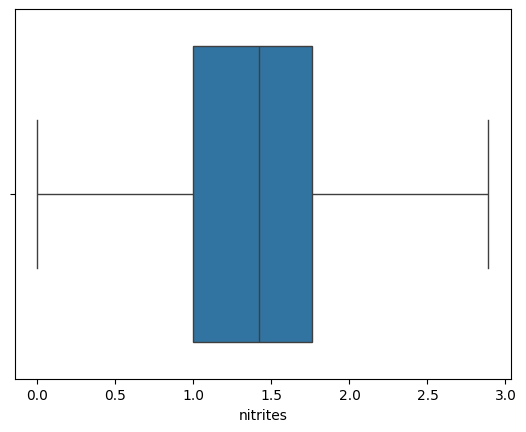

In [17]:
sns.boxplot(x = data.nitrites) # use for check outliers or not in column

In [18]:
data.head() # showing the top 5 data

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,...,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
0,1.65,9.08,0.04,2.85,0.007,0.35,0.83,0.17,0.05,0.20,...,0.054,16.08,1.13,0.007,37.75,6.78,0.08,0.34,0.02,1
1,2.32,21.16,0.01,3.31,0.002,5.28,0.68,0.66,0.90,0.65,...,0.100,2.01,1.93,0.003,32.26,3.21,0.08,0.27,0.05,1
2,1.01,14.02,0.04,0.58,0.008,4.24,0.53,0.02,0.99,0.05,...,0.078,14.16,1.11,0.006,50.28,7.07,0.07,0.44,0.01,0
3,1.36,11.33,0.04,2.96,0.001,7.23,0.03,1.66,1.08,0.71,...,0.016,1.41,1.29,0.004,9.12,1.72,0.02,0.45,0.05,1
4,0.92,24.33,0.03,0.20,0.006,2.67,0.69,0.57,0.61,0.13,...,0.117,6.74,1.11,0.003,16.90,2.41,0.02,0.06,0.02,1


In [26]:
data.ammonia.median() # find the mode

14.13

In [20]:
data.loc[data["ammonia"] == '#NUM!',"ammonia"] = 14.13 # handle the null value

In [21]:
data["ammonia"] = data["ammonia"].astype("float64") # change the datatype

In [22]:
data.is_safe.value_counts() # check the value counts

is_safe
0        7084
1         912
#NUM!       3
Name: count, dtype: int64

In [23]:
data.loc[data["is_safe"] == '#NUM!',"is_safe"] = 1 # handle the null value

In [24]:
data["is_safe"] = data["is_safe"].astype("int") # change the datatype

In [25]:
data.info() # check the dataset information

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7999 entries, 0 to 7998
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   aluminium    7999 non-null   float64
 1   ammonia      7999 non-null   float64
 2   arsenic      7999 non-null   float64
 3   barium       7999 non-null   float64
 4   cadmium      7999 non-null   float64
 5   chloramine   7999 non-null   float64
 6   chromium     7999 non-null   float64
 7   copper       7999 non-null   float64
 8   flouride     7999 non-null   float64
 9   bacteria     7999 non-null   float64
 10  viruses      7999 non-null   float64
 11  lead         7999 non-null   float64
 12  nitrates     7999 non-null   float64
 13  nitrites     7999 non-null   float64
 14  mercury      7999 non-null   float64
 15  perchlorate  7999 non-null   float64
 16  radium       7999 non-null   float64
 17  selenium     7999 non-null   float64
 18  silver       7999 non-null   float64
 19  uraniu

### Final Output
* Here output data is very unbalanced data

## Feature Selection

<Axes: >

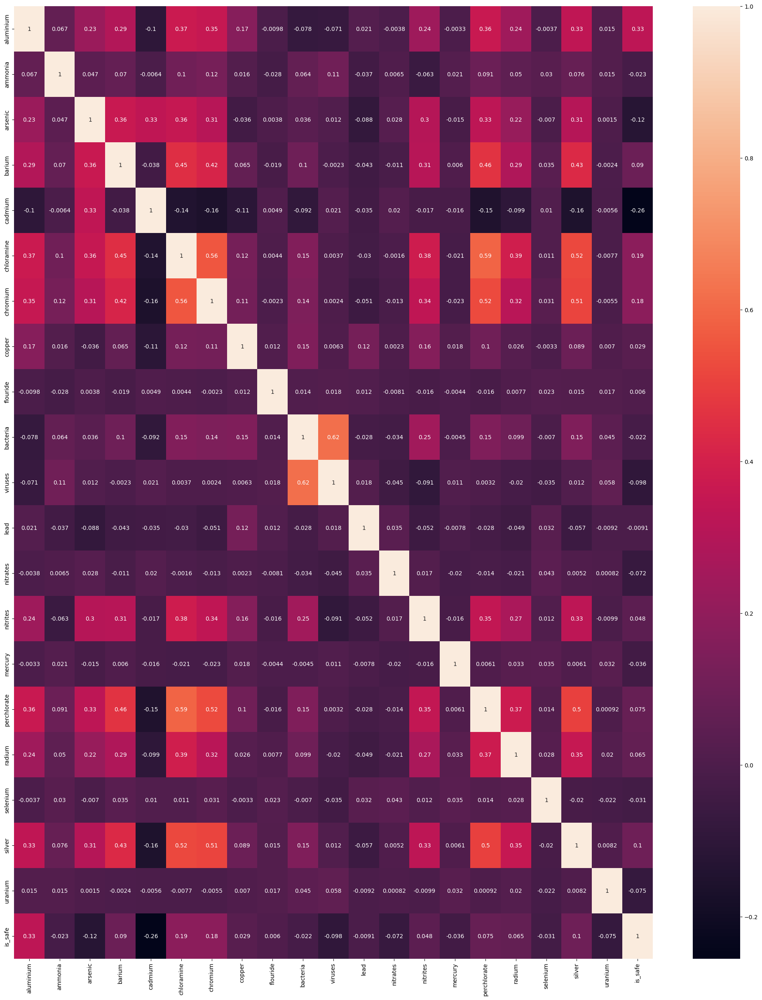

In [27]:
plt.figure(figsize=(25,30))
sns.heatmap(data.corr(),annot=True)

* Here we can not see the high corelation between any columns.

In [28]:
data.corr()

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,...,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
aluminium,1.000000,0.067369,0.225773,0.294145,-0.099911,0.369309,0.353218,0.168612,-0.009784,-0.078238,...,0.020792,-0.003810,0.237865,-0.003306,0.363069,0.243217,-0.003672,0.334993,0.014711,0.332950
ammonia,0.067369,1.000000,0.046784,0.070097,-0.006422,0.104768,0.124774,0.015954,-0.028216,0.063596,...,-0.037061,0.006484,-0.062935,0.020875,0.090922,0.050384,0.029894,0.075545,0.014632,-0.022903
arsenic,0.225773,0.046784,1.000000,0.362945,0.334682,0.356559,0.312475,-0.036444,0.003792,0.035688,...,-0.087756,0.027554,0.304566,-0.015404,0.332279,0.218204,-0.007009,0.307837,0.001455,-0.123530
barium,0.294145,0.070097,0.362945,1.000000,-0.037803,0.446928,0.415972,0.065426,-0.018548,0.101259,...,-0.042888,-0.011331,0.312473,0.005987,0.462234,0.286569,0.035242,0.431606,-0.002440,0.090232
cadmium,-0.099911,-0.006422,0.334682,-0.037803,1.000000,-0.144370,-0.157766,-0.109024,0.004880,-0.092431,...,-0.034959,0.020194,-0.016648,-0.016174,-0.149344,-0.099259,0.010145,-0.155408,-0.005633,-0.255405
chloramine,0.369309,0.104768,0.356559,0.446928,-0.144370,1.000000,0.555938,0.119059,0.004400,0.154510,...,-0.030479,-0.001551,0.380336,-0.021472,0.588769,0.388806,0.011399,0.522447,-0.007658,0.185590
chromium,0.353218,0.124774,0.312475,0.415972,-0.157766,0.555938,1.000000,0.113043,-0.002284,0.142041,...,-0.050501,-0.012793,0.336560,-0.022787,0.524532,0.315271,0.030539,0.510768,-0.005526,0.181262
copper,0.168612,0.015954,-0.036444,0.065426,-0.109024,0.119059,0.113043,1.000000,0.011683,0.149110,...,0.121765,0.002332,0.162682,0.017626,0.104564,0.026215,-0.003267,0.089333,0.006978,0.029097
flouride,-0.009784,-0.028216,0.003792,-0.018548,0.004880,0.004400,-0.002284,0.011683,1.000000,0.014134,...,0.011905,-0.008140,-0.016365,-0.004400,-0.016191,0.007688,0.022629,0.014554,0.016792,0.006025
bacteria,-0.078238,0.063596,0.035688,0.101259,-0.092431,0.154510,0.142041,0.149110,0.014134,1.000000,...,-0.027525,-0.033920,0.246889,-0.004471,0.147652,0.099298,-0.006971,0.148225,0.044839,-0.022453


## Logistic Regression Model Selection 

In [29]:
x = data.drop("is_safe",axis = 1) # create a independent variable
y = data.is_safe # create a dependent variable

In [30]:
x

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,viruses,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium
0,1.65,9.08,0.04,2.85,0.007,0.35,0.83,0.17,0.05,0.20,0.000,0.054,16.08,1.13,0.007,37.75,6.78,0.08,0.34,0.02
1,2.32,21.16,0.01,3.31,0.002,5.28,0.68,0.66,0.90,0.65,0.650,0.100,2.01,1.93,0.003,32.26,3.21,0.08,0.27,0.05
2,1.01,14.02,0.04,0.58,0.008,4.24,0.53,0.02,0.99,0.05,0.003,0.078,14.16,1.11,0.006,50.28,7.07,0.07,0.44,0.01
3,1.36,11.33,0.04,2.96,0.001,7.23,0.03,1.66,1.08,0.71,0.710,0.016,1.41,1.29,0.004,9.12,1.72,0.02,0.45,0.05
4,0.92,24.33,0.03,0.20,0.006,2.67,0.69,0.57,0.61,0.13,0.001,0.117,6.74,1.11,0.003,16.90,2.41,0.02,0.06,0.02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7994,0.05,7.78,0.00,1.95,0.040,0.10,0.03,0.03,1.37,0.00,0.000,0.197,14.29,1.00,0.005,3.57,2.13,0.09,0.06,0.03
7995,0.05,24.22,0.02,0.59,0.010,0.45,0.02,0.02,1.48,0.00,0.000,0.031,10.27,1.00,0.001,1.48,1.11,0.09,0.10,0.08
7996,0.09,6.85,0.00,0.61,0.030,0.05,0.05,0.02,0.91,0.00,0.000,0.182,15.92,1.00,0.000,1.35,4.84,0.00,0.04,0.05
7997,0.01,10.00,0.01,2.00,0.000,2.00,0.00,0.09,0.00,0.00,0.000,0.000,0.00,0.00,0.000,0.00,0.00,0.00,0.00,0.00


In [31]:
y

0       1
1       1
2       0
3       1
4       1
       ..
7994    1
7995    1
7996    1
7997    1
7998    1
Name: is_safe, Length: 7999, dtype: int32

In [32]:
from sklearn.preprocessing import MinMaxScaler # import the scalling
ME = MinMaxScaler() # call the scall method
df = ME.fit_transform(x) # transform the data

In [33]:
df

array([[0.32673267, 0.30614973, 0.03809524, ..., 0.8       , 0.68      ,
        0.22222222],
       [0.45940594, 0.70989305, 0.00952381, ..., 0.8       , 0.54      ,
        0.55555556],
       [0.2       , 0.47125668, 0.03809524, ..., 0.7       , 0.88      ,
        0.11111111],
       ...,
       [0.01782178, 0.23161765, 0.        , ..., 0.        , 0.08      ,
        0.55555556],
       [0.0019802 , 0.3368984 , 0.00952381, ..., 0.        , 0.        ,
        0.        ],
       [0.00792079, 0.23161765, 0.00952381, ..., 0.        , 0.08      ,
        0.55555556]])

In [34]:
x.columns # check the columns

Index(['aluminium', 'ammonia', 'arsenic', 'barium', 'cadmium', 'chloramine',
       'chromium', 'copper', 'flouride', 'bacteria', 'viruses', 'lead',
       'nitrates', 'nitrites', 'mercury', 'perchlorate', 'radium', 'selenium',
       'silver', 'uranium'],
      dtype='object')

In [35]:
# scalling data convert to the dataframe
x1 = pd.DataFrame(data = df,columns=['aluminium', 'ammonia', 'arsenic', 'barium', 'cadmium', 'chloramine',
       'chromium', 'copper', 'flouride', 'bacteria', 'viruses', 'lead',
       'nitrates', 'nitrites', 'mercury', 'perchlorate', 'radium', 'selenium',
       'silver', 'uranium'])

In [36]:
x1

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,viruses,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium
0,0.326733,0.306150,0.038095,0.576923,0.053846,0.040323,0.922222,0.085,0.033333,0.20,0.000,0.270,0.810893,0.391003,0.7,0.629062,0.848561,0.8,0.68,0.222222
1,0.459406,0.709893,0.009524,0.670040,0.015385,0.608295,0.755556,0.330,0.600000,0.65,0.650,0.500,0.101362,0.667820,0.3,0.537577,0.401752,0.8,0.54,0.555556
2,0.200000,0.471257,0.038095,0.117409,0.061538,0.488479,0.588889,0.010,0.660000,0.05,0.003,0.390,0.714070,0.384083,0.6,0.837860,0.884856,0.7,0.88,0.111111
3,0.269307,0.381350,0.038095,0.599190,0.007692,0.832949,0.033333,0.830,0.720000,0.71,0.710,0.080,0.071104,0.446367,0.4,0.151975,0.215269,0.2,0.90,0.555556
4,0.182178,0.815842,0.028571,0.040486,0.046154,0.307604,0.766667,0.285,0.406667,0.13,0.001,0.585,0.339889,0.384083,0.3,0.281620,0.301627,0.2,0.12,0.222222
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7994,0.009901,0.262701,0.000000,0.394737,0.307692,0.011521,0.033333,0.015,0.913333,0.00,0.000,0.985,0.720625,0.346021,0.5,0.059490,0.266583,0.9,0.12,0.333333
7995,0.009901,0.812166,0.019048,0.119433,0.076923,0.051843,0.022222,0.010,0.986667,0.00,0.000,0.155,0.517902,0.346021,0.1,0.024663,0.138924,0.9,0.20,0.888889
7996,0.017822,0.231618,0.000000,0.123482,0.230769,0.005760,0.055556,0.010,0.606667,0.00,0.000,0.910,0.802824,0.346021,0.0,0.022496,0.605757,0.0,0.08,0.555556
7997,0.001980,0.336898,0.009524,0.404858,0.000000,0.230415,0.000000,0.045,0.000000,0.00,0.000,0.000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.00,0.000000


In [37]:
y1 = data.is_safe # create a dependent variable

In [38]:
y1

0       1
1       1
2       0
3       1
4       1
       ..
7994    1
7995    1
7996    1
7997    1
7998    1
Name: is_safe, Length: 7999, dtype: int32

In [39]:
from sklearn.model_selection import train_test_split # import split model
x_train,x_test,y_train,y_test = train_test_split(x1,y1,test_size=0.25,random_state=40) # split the data train and test

In [40]:
x_train

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,viruses,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium
2761,0.001980,0.744652,0.000952,0.455466,0.023077,0.546083,0.166667,0.665,0.420000,0.74,0.740,0.660,0.556732,0.640138,0.9,0.515081,0.836045,1.0,0.22,0.555556
4141,0.011881,0.123663,0.009524,0.036437,0.692308,0.002304,0.055556,0.025,0.046667,0.00,0.790,0.820,0.032779,0.228374,1.0,0.121480,0.097622,0.6,0.06,0.444444
2994,0.003960,0.518717,0.038095,0.334008,0.007692,0.764977,0.788889,0.735,0.100000,0.37,0.002,0.425,0.955623,0.664360,0.1,0.551075,0.444305,0.5,0.36,0.777778
4782,0.009901,0.643048,0.085714,0.050607,0.076923,0.061060,0.066667,0.040,0.606667,0.00,0.008,0.095,0.205245,0.107266,0.8,0.008999,0.011264,0.3,0.10,0.444444
740,0.306931,0.380348,0.019048,0.635628,0.053846,0.866359,0.033333,0.050,0.920000,0.00,0.000,0.165,0.374685,0.536332,0.7,0.329445,0.302879,0.9,0.52,0.222222
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3064,0.007921,0.703877,0.419048,0.854251,0.692308,0.430876,0.022222,0.095,0.346667,0.74,0.740,0.310,0.363591,0.730104,0.4,0.497584,0.832290,0.0,0.84,0.222222
6309,0.011881,0.803142,0.047619,0.261134,0.000000,0.019585,0.100000,0.460,0.726667,0.75,0.750,0.425,0.304085,0.460208,0.9,0.029995,0.110138,0.5,0.00,0.111111
6151,0.005941,0.844586,0.047619,0.151822,0.230769,0.018433,0.033333,0.390,0.060000,0.83,0.830,0.690,0.528996,0.508651,0.9,0.155474,0.414268,0.9,0.08,0.555556
6363,0.017822,0.419118,0.047619,0.340081,0.230769,0.001152,0.011111,0.985,0.906667,0.37,0.001,0.300,0.730711,0.439446,0.4,0.111815,0.070088,0.3,0.18,0.555556


In [41]:
x_test

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,viruses,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium
5324,0.007921,0.630013,0.066667,0.103239,0.307692,0.061060,0.033333,0.920,0.500000,0.00,0.920,0.710,0.403429,0.314879,0.4,0.022996,0.098874,0.2,0.20,1.000000
7391,0.015842,0.488302,0.085714,0.135628,0.153846,0.044931,0.088889,0.155,0.493333,0.55,0.550,0.465,0.443772,0.698962,0.9,0.128479,0.785982,0.9,0.02,0.555556
6145,0.011881,0.978275,0.009524,0.030364,0.461538,0.010369,0.011111,0.755,0.240000,0.78,0.780,0.795,0.679778,0.550173,0.8,0.098317,0.257822,0.7,0.16,0.777778
2242,0.007921,0.398396,0.047619,0.554656,0.061538,0.703917,0.155556,0.995,0.960000,0.15,0.003,0.500,0.193646,0.577855,1.0,0.515081,0.265332,0.2,0.98,0.444444
4100,0.019802,0.970254,0.047619,0.354251,0.538462,0.010369,0.077778,0.035,0.946667,0.00,1.000,0.410,0.569844,0.245675,0.6,0.047492,0.082603,0.0,0.06,0.555556
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5831,0.007921,0.964906,0.028571,0.135628,0.153846,0.006912,0.088889,0.450,0.186667,0.19,0.001,0.295,0.526475,0.017301,0.6,0.014498,0.112641,0.6,0.12,0.888889
4396,0.015842,0.253676,0.028571,0.178138,0.461538,0.004608,0.033333,0.045,0.866667,0.03,0.007,0.550,0.054463,0.193772,0.8,0.141476,0.031289,0.7,0.20,0.444444
1715,0.041584,0.513035,0.971429,0.736842,0.461538,0.282258,0.055556,0.950,0.733333,1.00,1.000,0.825,0.427131,0.588235,0.3,0.475087,0.429287,0.9,0.20,0.000000
1094,0.556436,0.138035,0.904762,0.585020,0.923077,0.542627,0.211111,0.615,0.573333,0.00,0.000,0.095,0.860817,0.539792,0.7,0.197467,0.202753,0.1,0.42,0.888889


In [42]:
from imblearn.over_sampling import SMOTE # import SMOTE

In [43]:
smote = SMOTE() # call the smote
x_train_smote,y_train_smote = smote.fit_resample(x_train,y_train) # create the smote variable

In [44]:
from collections import Counter # Import the Counter
print("Before data",Counter(y_train)) # check the previous value
print("After Over Sampling",Counter(y_train_smote)) # check the previous value

Before data Counter({0: 5307, 1: 692})
After Over Sampling Counter({0: 5307, 1: 5307})


In [45]:
from sklearn.linear_model import LogisticRegression # import the logistic regression model
LR = LogisticRegression() # call the model
LR.fit(x_train_smote,y_train_smote) # train the data

LogisticRegression()

In [46]:
y_lr = LR.predict(x_test) # predict the test data

In [47]:
y_lr

array([0, 0, 0, ..., 0, 0, 0])

In [48]:
y_test

5324    0
7391    0
6145    0
2242    0
4100    0
       ..
5831    0
4396    1
1715    0
1094    0
4308    0
Name: is_safe, Length: 2000, dtype: int32

In [49]:
# import the logistic regression metrics
from sklearn.metrics import accuracy_score,f1_score,confusion_matrix,classification_report

In [188]:
a1 = accuracy_score(y_test,y_lr) # check the model performance
a1

0.8115

In [189]:
f1 = f1_score(y_test,y_lr,average="weighted") # check training accuracy
f1

0.8394439638344259

In [52]:
print(classification_report(y_test,y_lr)) # check the model report

              precision    recall  f1-score   support

           0       0.97      0.82      0.89      1777
           1       0.34      0.77      0.48       223

    accuracy                           0.81      2000
   macro avg       0.66      0.79      0.68      2000
weighted avg       0.90      0.81      0.84      2000



## SVM:- Support Vectore Machine

In [53]:
from sklearn.svm import SVC # import the SVM Algorithm
svm = SVC() # call Algorithm 
svm.fit(x_train_smote,y_train_smote) # train the model

SVC()

In [54]:
y_svm = svm.predict(x_test) # predcit the test data

In [190]:
a2 = accuracy_score(y_test,y_svm) # check the model performance
a2

0.9185

In [191]:
f2 = f1_score(y_test,y_svm,average="weighted") # check training accuracy
f2

0.9230391451176775

In [57]:
print(classification_report(y_test,y_svm))  # check the model report

              precision    recall  f1-score   support

           0       0.97      0.94      0.95      1777
           1       0.60      0.78      0.68       223

    accuracy                           0.92      2000
   macro avg       0.79      0.86      0.82      2000
weighted avg       0.93      0.92      0.92      2000



## Decision Tree Algorithm

In [58]:
from sklearn.tree import DecisionTreeClassifier # import Decision tree algorithm
DT = DecisionTreeClassifier() # call the Decision tree model
DT.fit(x_train_smote,y_train_smote) # train the model

DecisionTreeClassifier()

In [59]:
y_dt = DT.predict(x_test) # predict the test data

In [192]:
a3 = accuracy_score(y_test,y_dt) # check the model performance
a3

0.944

In [193]:
f3 = f1_score(y_test,y_dt,average="weighted") # check training accuracy
f3

0.9457128787878788

In [62]:
print(classification_report(y_test,y_dt)) # check the model report

              precision    recall  f1-score   support

           0       0.98      0.96      0.97      1777
           1       0.72      0.83      0.77       223

    accuracy                           0.94      2000
   macro avg       0.85      0.89      0.87      2000
weighted avg       0.95      0.94      0.95      2000



## KNN:- K nearest Neighbor 

In [63]:
from sklearn.neighbors import KNeighborsClassifier # import the knn algorithm
knn = KNeighborsClassifier() # call the knn model
knn.fit(x_train_smote,y_train_smote) # train the model

KNeighborsClassifier()

In [64]:
y_knn = knn.predict(x_test) # predict the test data

In [194]:
a4 = accuracy_score(y_test,y_knn) # check the model performance
a4

0.785

In [195]:
f4 = f1_score(y_test,y_knn,average="weighted")  # check training accuracy
f4

0.819797065164143

In [67]:
print(classification_report(y_test,y_knn)) # check model report

              precision    recall  f1-score   support

           0       0.97      0.79      0.87      1777
           1       0.31      0.78      0.45       223

    accuracy                           0.79      2000
   macro avg       0.64      0.78      0.66      2000
weighted avg       0.89      0.79      0.82      2000



## Bagging Algorithm

In [69]:
from sklearn.ensemble import BaggingClassifier # import the bagging algorithm
model_dt = DecisionTreeClassifier # call the DT model
bg = BaggingClassifier() # call the BG model
bg.fit(x_train_smote,y_train_smote) # train the model

BaggingClassifier()

In [70]:
y_bg = bg.predict(x_test) # predict the test data

In [196]:
a5 = accuracy_score(y_test,y_bg)  # check the model performance
a5

0.964

In [197]:
f5 = f1_score(y_test,y_bg)  # check training accuracy
f5

0.8407079646017699

In [73]:
print(classification_report(y_test,y_bg))  # check model report

              precision    recall  f1-score   support

           0       0.98      0.98      0.98      1777
           1       0.83      0.85      0.84       223

    accuracy                           0.96      2000
   macro avg       0.91      0.92      0.91      2000
weighted avg       0.96      0.96      0.96      2000



## Random Forest Algorithm

In [74]:
from sklearn.ensemble import RandomForestClassifier # import the RF algorithm
RM = RandomForestClassifier() # call teh model
RM.fit(x_train_smote,y_train_smote) # train the model

RandomForestClassifier()

In [75]:
y_rm = RM.predict(x_test) # predict the test data

In [198]:
a6 = accuracy_score(y_test,y_rm) # check the model performance
a6

0.9495

In [199]:
f6 = f1_score(y_test,y_rm,average="weighted")  # check training accuracy
f6

0.9498403457574756

In [78]:
print(classification_report(y_test,y_rm))  # check model report

              precision    recall  f1-score   support

           0       0.97      0.97      0.97      1777
           1       0.77      0.79      0.78       223

    accuracy                           0.95      2000
   macro avg       0.87      0.88      0.87      2000
weighted avg       0.95      0.95      0.95      2000



## Gradiant Boosting Algorithm

In [79]:
from sklearn.ensemble import GradientBoostingClassifier # import GBC algorithm
GBC = GradientBoostingClassifier() # call the GBC model
GBC.fit(x_train_smote,y_train_smote) # train the model

GradientBoostingClassifier()

In [80]:
y_gbc = GBC.predict(x_test)  # predict the test data

In [200]:
a7 = accuracy_score(y_test,y_gbc) # check the model performance
a7

0.9375

In [201]:
f7 = f1_score(y_test,y_gbc,average="weighted") # check training accuracy
f7

0.9404394269477622

In [85]:
print(classification_report(y_test,y_gbc)) # check model report

              precision    recall  f1-score   support

           0       0.98      0.95      0.96      1777
           1       0.68      0.84      0.75       223

    accuracy                           0.94      2000
   macro avg       0.83      0.90      0.86      2000
weighted avg       0.95      0.94      0.94      2000



## Xtrame Gradiant Boosting

In [164]:
from xgboost import XGBClassifier # import XGBalgorithm
XGB = XGBClassifier(n_estimators=651,max_depth=23,learning_rate=0.2) # call the xgb model
XGB.fit(x_train_smote,y_train_smote) # train the model

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.2, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=23, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=651, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [165]:
y_xgb = XGB.predict(x_test) # predict the test data

In [202]:
a8 = accuracy_score(y_test,y_xgb) # check the model performance
a8

0.9635

In [203]:
f8 = f1_score(y_test,y_xgb,average="weighted") # check training accuracy
f8

0.9635356912361297

In [168]:
print(classification_report(y_test,y_xgb)) # check model report

              precision    recall  f1-score   support

           0       0.98      0.98      0.98      1777
           1       0.83      0.84      0.84       223

    accuracy                           0.96      2000
   macro avg       0.91      0.91      0.91      2000
weighted avg       0.96      0.96      0.96      2000



## Adda Boosting Algorithm

In [92]:
from sklearn.ensemble import AdaBoostClassifier # import the adda boosting algorithm
ABC = AdaBoostClassifier() # call the abc model
ABC.fit(x_train_smote,y_train_smote) # train the model

AdaBoostClassifier()

In [93]:
y_abc = ABC.predict(x_test) # predict the test data

In [204]:
a9 = accuracy_score(y_test,y_abc) # check the model performance
a9

0.879

In [205]:
f9 = f1_score(y_test,y_abc,average="weighted") # check training accuracy
f9

0.8898440772842182

In [97]:
print(classification_report(y_test,y_abc)) # check model report

              precision    recall  f1-score   support

           0       0.96      0.90      0.93      1777
           1       0.47      0.73      0.57       223

    accuracy                           0.88      2000
   macro avg       0.72      0.81      0.75      2000
weighted avg       0.91      0.88      0.89      2000



## ANN:- Artificial Neural Network

In [182]:
from sklearn.neural_network import MLPClassifier # import ann algorithm
ANN = MLPClassifier(activation='relu',solver='adam') # call the ann model
ANN.fit(x_train_smote,y_train_smote) # train the model

MLPClassifier()

In [183]:
y_ann = ANN.predict(x_test)  # predict the test data

In [206]:
a10 = accuracy_score(y_test,y_ann) # check the model performance
a10

0.941

In [207]:
f10 = f1_score(y_test,y_ann,average="weighted") # check training accuracy
f10

0.9418882363161616

In [186]:
print(classification_report(y_test,y_ann)) # check model report

              precision    recall  f1-score   support

           0       0.97      0.96      0.97      1777
           1       0.72      0.77      0.74       223

    accuracy                           0.94      2000
   macro avg       0.85      0.87      0.86      2000
weighted avg       0.94      0.94      0.94      2000



### Model Comparison Report

In [209]:
# check the All model r2 score in DataFrame
score = pd.DataFrame({"Model Name":["LogisticRegression","SVM Algorithm","DecisionTreeclassifier","KNN Algorithm","Bagging Algorithm","RandomForestClassifier","GradiantBoostingClassifier","XGBClassifier","AddaBoostingClassifier","ANN_MLPClassifier"],
                     "Accuracy_Score":[a1*100,a2*100,a3*100,a4*100,a5*100,a6*100,a7*100,a8*100,a9*100,a10*100],
                     "F1_Score":[f1*100,f2*100,f3*100,f4*100,f5*100,f6*100,f7*100,f8*100,f9*100,f10*100]})
score

,Model Name,Accuracy_Score,F1_Score
0,LogisticRegression,81.15,83.944396
1,SVM Algorithm,91.85,92.303915
2,DecisionTreeclassifier,94.40,94.571288
3,KNN Algorithm,78.50,81.979707
4,Bagging Algorithm,96.40,84.070796
5,RandomForestClassifier,94.95,94.984035
6,GradiantBoostingClassifier,93.75,94.043943
7,XGBClassifier,96.35,96.353569
8,AddaBoostingClassifier,87.90,88.984408
9,ANN_MLPClassifier,94.10,94.188824


### Final Conclusion

* Here we can are use the total 10 algorithm in this dataset like Logistic Regression, SVM Algorithm, DecisionTreeClassifier,
KNN ALgorithm, Bagging Algorithm, RandomForestClassifier, GradiantBoostingClassifier, XGBClassifierAddaBoostingClassifier, ANN_MLPClassifier.
* Here we can see the Highest model accuracy_score provide XGBClassifier Algorithm is 96.35 and f1_score is 96.35.
* Here we can see the Highest model accuracy_score provide DecisionTree Algorithm is 94.40 and f1_score is 94.57.

                                                            ! Thank You !